### Import Libraries

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import folium
from sklearn.cluster import KMeans

### Load Dataset

In [46]:
df = pd.read_csv(r'C:\Users\Ashish Mishra\OneDrive\Desktop\Machine Learning\Dataset.csv')
df.head(5)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


### Group Restaurants by City/Locality and Visualize the Distribution

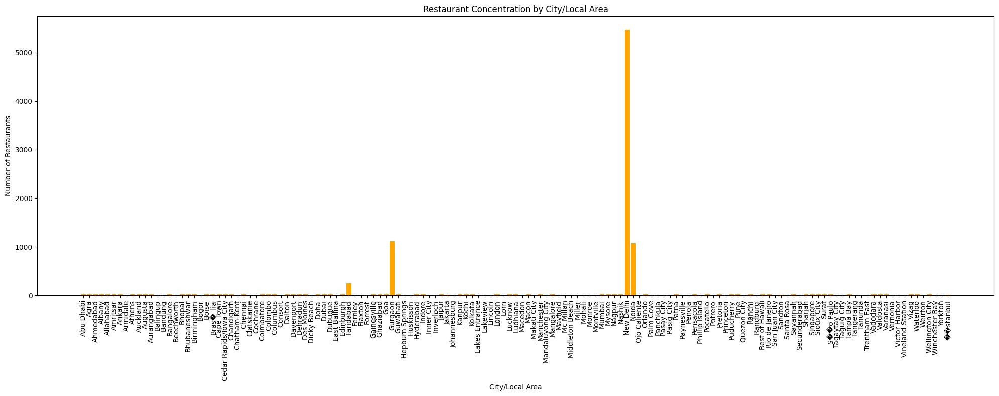

In [47]:
city_grouped = df.groupby('City')
restaurant_count = city_grouped['Restaurant Name'].count()

plt.figure(figsize=(20, 8))
plt.bar(restaurant_count.index, restaurant_count.values, color='orange')
plt.xlabel('City/Local Area')
plt.ylabel('Number of Restaurants')
plt.title('Restaurant Concentration by City/Local Area')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


In [48]:
from folium.plugins import MarkerCluster

restaurant_map = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=12, tiles='CartoDB Positron')

marker_cluster = MarkerCluster().add_to(restaurant_map)

for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=folium.Popup(f"Restaurant: {row['Restaurant Name']}<br>Address: {row['Address']}", max_width=250),
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(marker_cluster)

restaurant_map

### Preparing data for clustering

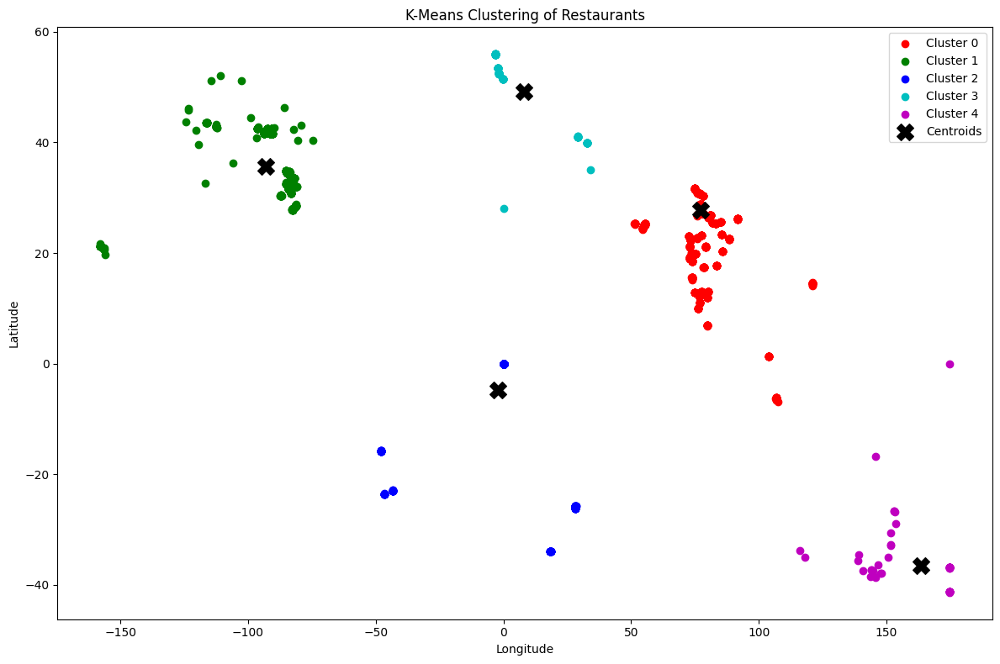

In [49]:
X = df[['Latitude', 'Longitude']]

k = 5
kmeans = KMeans(n_clusters=k, random_state=0)
df['Cluster'] = kmeans.fit_predict(X)

plt.figure(figsize=(12, 8))
colors = ['r', 'g', 'b', 'c', 'm']

for cluster_num in range(k):
    cluster_data = df[df['Cluster'] == cluster_num]
    plt.scatter(cluster_data['Longitude'], cluster_data['Latitude'],
                c=colors[cluster_num], label=f'Cluster {cluster_num}')

plt.scatter(kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:, 0],
            s=200, c='black', marker='X', label='Centroids')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('K-Means Clustering of Restaurants')
plt.legend()
plt.tight_layout()
plt.show()

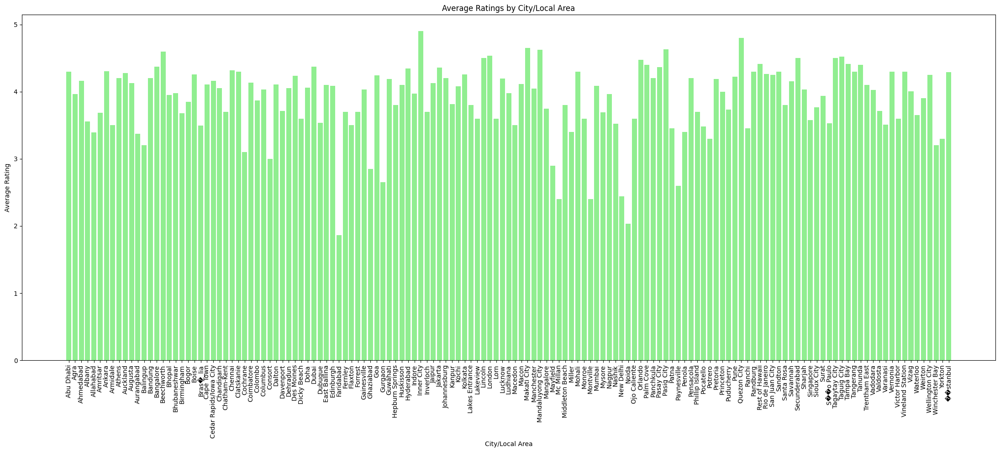

In [50]:
average_ratings_by_city = city_grouped['Aggregate rating'].mean()

plt.figure(figsize=(22, 10))
plt.bar(average_ratings_by_city.index, average_ratings_by_city.values, color='lightgreen')
plt.xlabel('City/Local Area')
plt.ylabel('Average Rating')
plt.title('Average Ratings by City/Local Area')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### Popular Cuisines by City/Locality

In [51]:
popular_cuisines_by_city = grouped_by_city['Cuisines'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else 'No Data')

print(popular_cuisines_by_city)

City
CityA    Chinese
CityB     Indian
CityC     French
Name: Cuisines, dtype: object


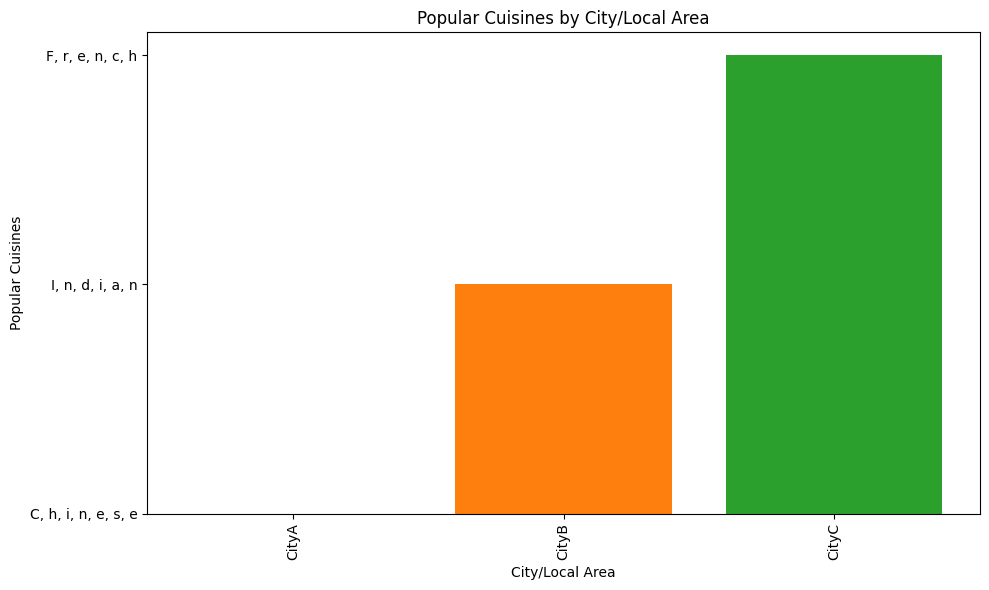

In [52]:
plt.figure(figsize=(10, 6)) 

for city, cuisines in popular_cuisines_by_city.items(): 
    plt.bar(city, ', '.join(cuisines)) 
    plt.xlabel('City/Local Area') 
    plt.ylabel('Popular Cuisines') 
    plt.title('Popular Cuisines by City/Local Area') 
    plt.xticks(rotation=90) # Rotate x-axis labels for better readability 
    plt.tight_layout()  
    
plt.show()

### Cuisine diversity

In [53]:
grouped_by_city = df.groupby('City') 
cuisine_diversity = grouped_by_city['Cuisines'].apply(lambda x: len(set(x))) 
print(cuisine_diversity)

City
Abu Dhabi          17
Agra               15
Ahmedabad          21
Albany             17
Allahabad          18
                   ..
Weirton             1
Wellington City    17
Winchester Bay      1
Yorkton             1
��stanbul          11
Name: Cuisines, Length: 141, dtype: int64


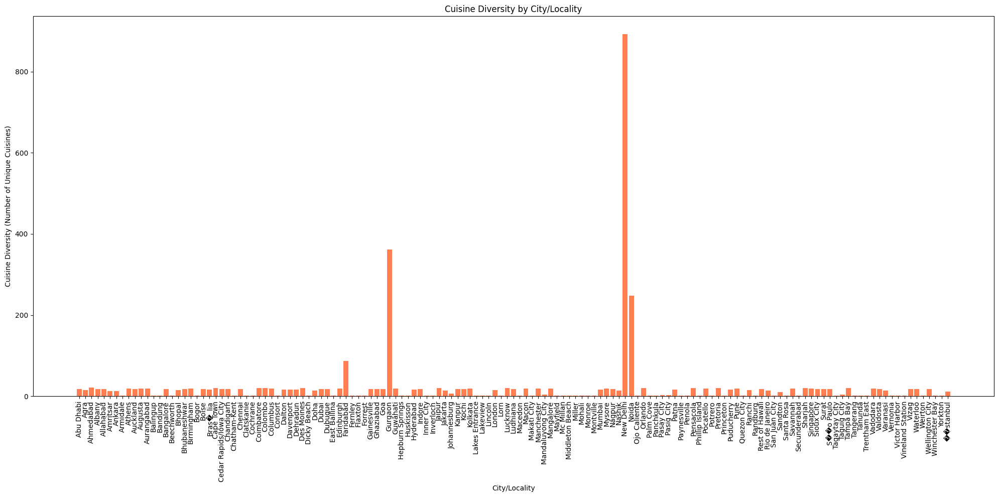

In [56]:
cuisine_diversity = grouped_by_city['Cuisines'].apply(lambda x: len(set(x)))

plt.figure(figsize=(20, 10))
plt.bar(cuisine_diversity.index, cuisine_diversity.values, color='coral')
plt.xlabel('City/Locality')
plt.ylabel('Cuisine Diversity (Number of Unique Cuisines)')
plt.title('Cuisine Diversity by City/Locality')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


### Price Range Analysis by City/Locality

In [55]:
common_price_range_by_city = grouped_by_city['Price range'].agg(lambda x: x.mode().iloc[0]) 
print(common_price_range_by_city)

City
Abu Dhabi          4
Agra               2
Ahmedabad          3
Albany             1
Allahabad          3
                  ..
Weirton            2
Wellington City    4
Winchester Bay     2
Yorkton            2
��stanbul          3
Name: Price range, Length: 141, dtype: int64


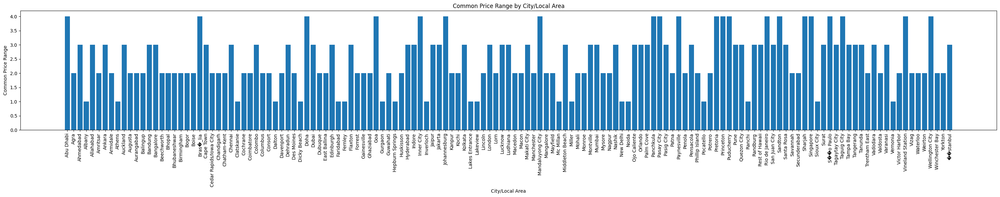

In [59]:
plt.figure(figsize=(30, 6)) 

plt.bar(common_price_range_by_city.index, common_price_range_by_city.values) 
plt.xlabel('City/Local Area') 
plt.ylabel('Common Price Range') 
plt.title('Common Price Range by City/Local Area') 
plt.xticks(rotation=90) 
plt.tight_layout() 
plt.show()

### Conclusion: 

    Performed a geographical analysis of the restaurants based on Average Ratings, Cuisine Ratings and Cuisines Diversity by City/Locality.